In [ ]:
'''
kmeans、louvain、spectral三种聚类的ARI、NMI、COM、HOMO、SIL指标热图
'''

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import os

In [2]:
colors = ["#313695", "#4575b4", "#74add1", "#abd9e9",
          "#e0f3f8", "#ffffbf",
          "#fee090", "#fdae61", "#f46d43", "#d73027", "#a50026"]
cmap = LinearSegmentedColormap.from_list("blue_yellow_red", colors)

### scDesign3

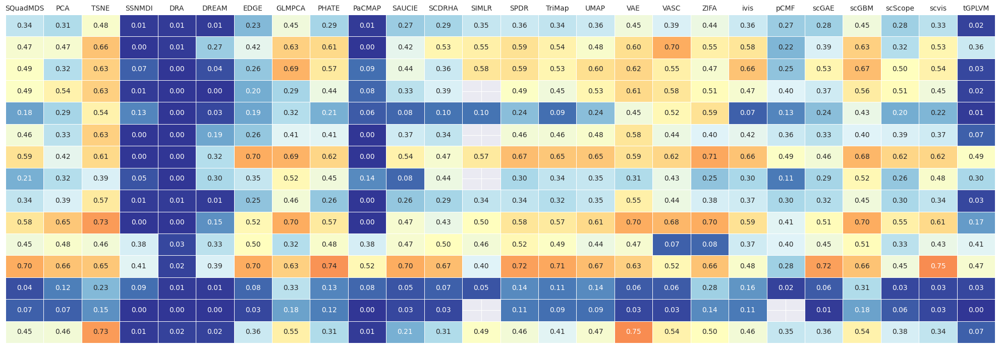

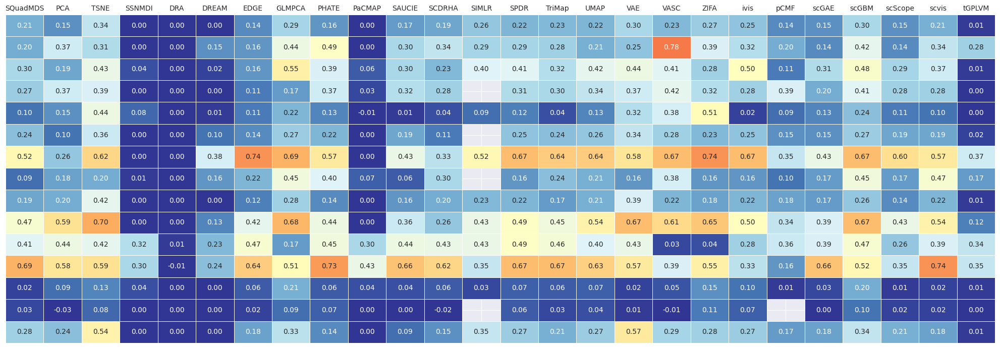

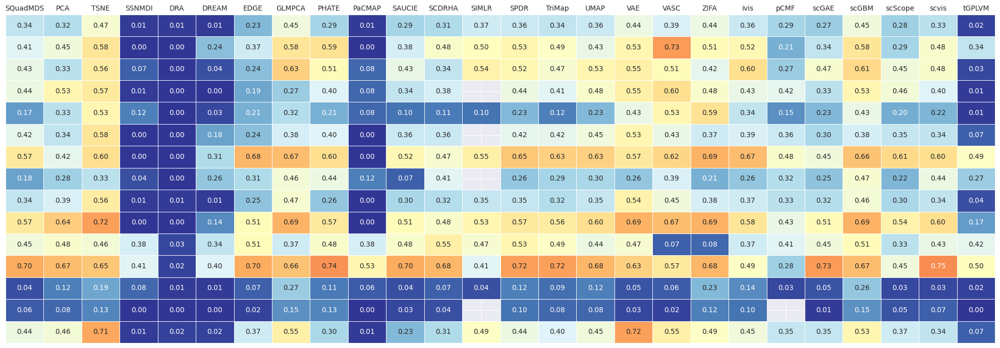

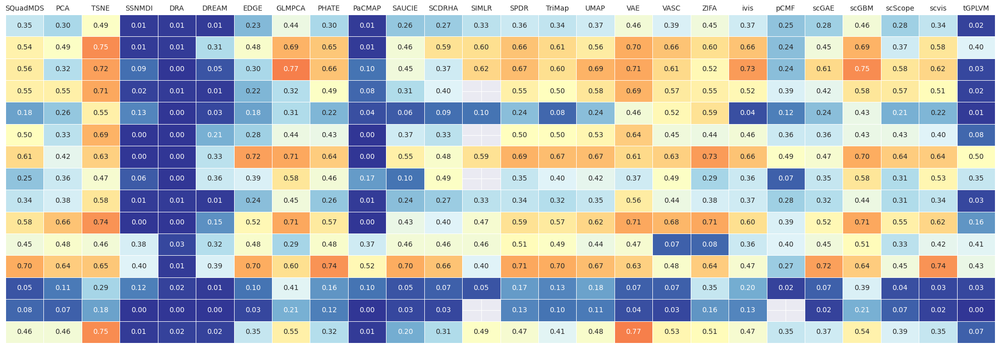

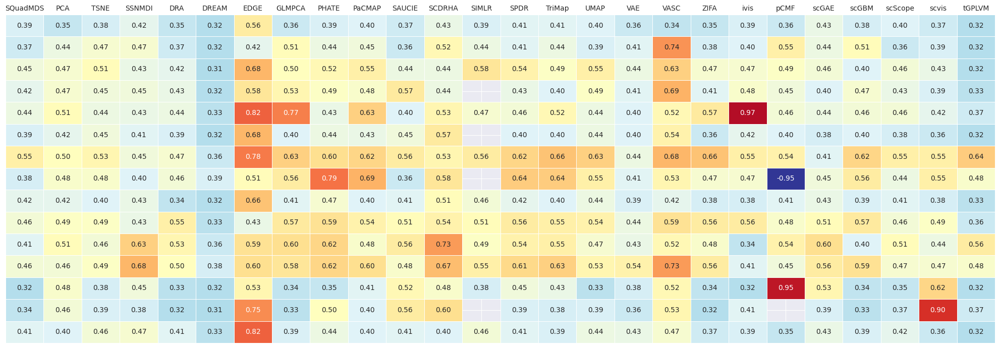

...

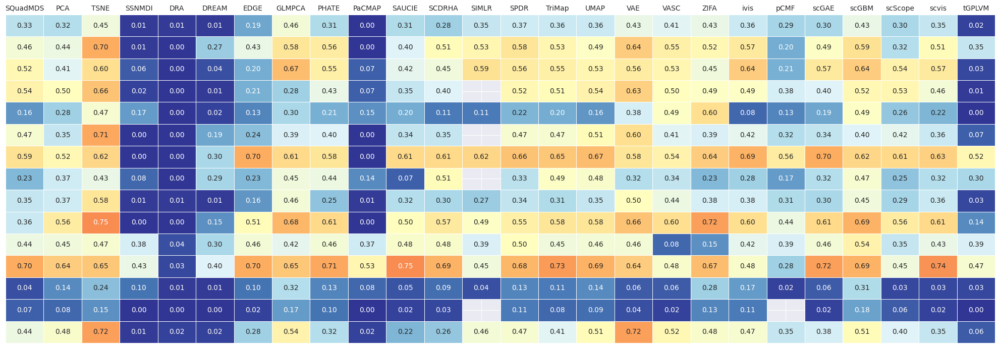

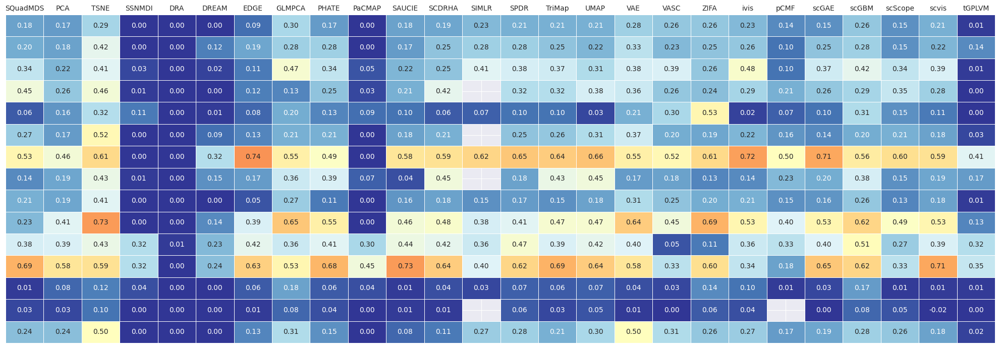

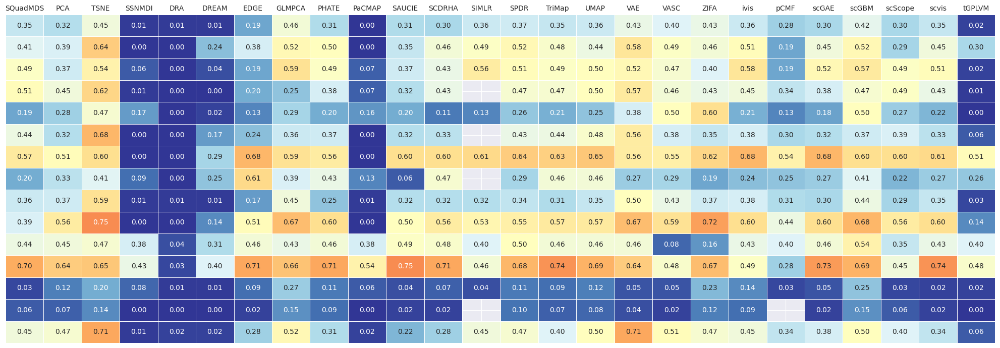

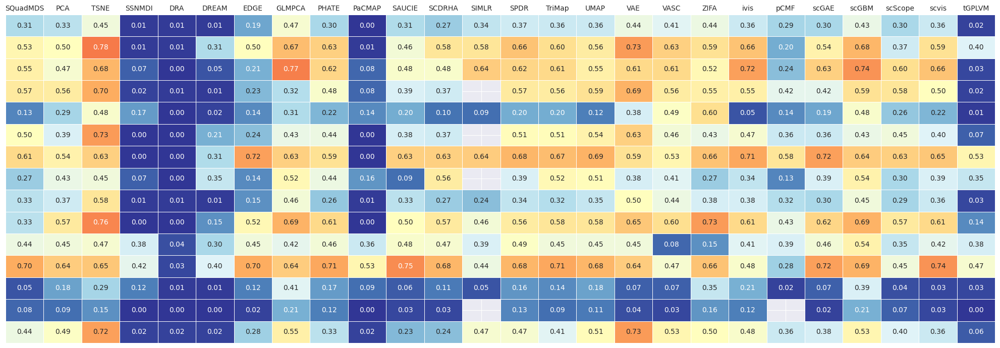

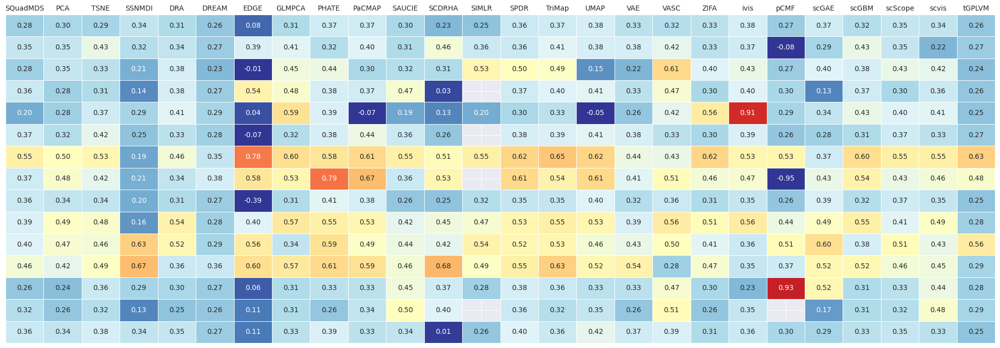

In [8]:
methods = ['kmeans','louvain','spectral']
metrics = ['NMI','ARI','COMP','HOMO','SIL']
for method in methods:
    for metric in metrics:
        datasets = ['ACINAR','ATAC','BATCH','CITE','EMBYRO','MARROW','MOBSC','OVARIAN','PANCREAS','SCGEMMETH','SCGEMRNA','SCIATAC', 'VISIUM', 'IFNB','SLIDE']

        df_all = pd.DataFrame()

        for dataset in datasets:
            file = f"/home/henu/work/result/cluster/scDesign3/{dataset}/indicators/{method}_{metric}.csv"
            df = pd.read_csv(file)
            df['Dataset'] = dataset

            # 排除特定的行
            excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
            df = df[~df['Method'].isin(excluded_methods)]

            # 重命名方法名
            df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

            # 拼接
            df_all = pd.concat([df_all, df])

        # print(df_all)
        # 透视表：行是数据集，列是方法，值是NMI
        heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

        # 将0.00和-0.00替换为0
        heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


        # 重新排序列，将SSNMDI与TSNE换一下位置
        order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
        heatmap_data = heatmap_data[order]

        # 画图
        '''
        按一个数据集高为0.35来调节
        '''
        plt.figure(figsize=(20, 7))  # 调节宽和高
        ax = sns.heatmap(
            heatmap_data,
            annot=True,
            fmt=".2f",
            cmap=cmap,
            linewidths=0.5,
            # cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
            cbar=False,
            vmin=0.0,  # 颜色条取值范围
            vmax=1.0
        )

        # 移除x轴和y轴的标签
        ax.set_xlabel('')
        ax.set_ylabel('')
        # 将指标名称移到顶部
        ax.xaxis.set_ticks_position('top')
        ax.xaxis.set_label_position('top')
        # 移除所有刻度线
        ax.tick_params(axis='both', which='both', length=0)

        # 移除左侧数据集名称
        ax.set_yticklabels([])

        # 旋转y轴标签，使其横向显示
        # plt.yticks(rotation=0)  # 0 度旋转，即横向显示

        plt.tight_layout()

        # 保存为矢量图###
        result_path = f'/home/henu/work/result/figures/cluster1/{metric}/{method}'
        if not os.path.exists(result_path):
            os.makedirs(result_path)
        plt.savefig(f'/home/henu/work/result/figures/cluster1/{metric}/{method}/scDesign3.svg')
        plt.savefig(f'/home/henu/work/result/figures/cluster1/{metric}/{method}/scDesign3.pdf')
        # plt.show()


### SIMLR

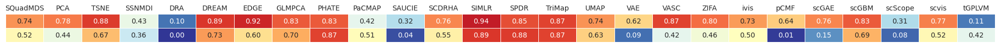

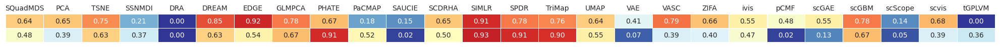

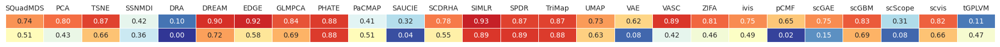

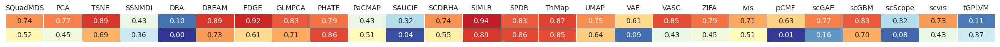

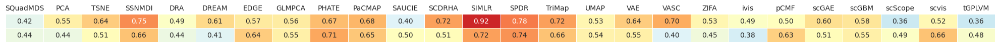

...

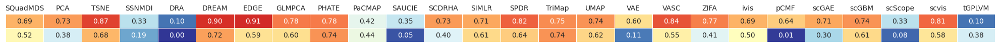

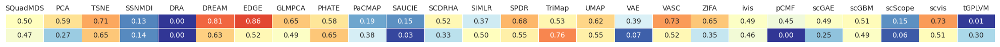

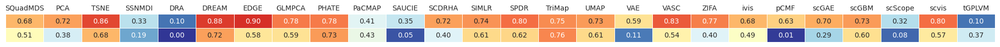

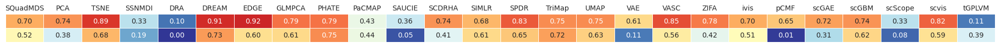

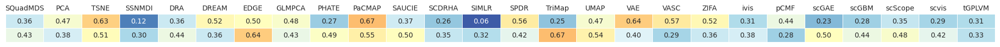

In [9]:
methods = ['kmeans','louvain','spectral']
metrics = ['NMI','ARI','COMP','HOMO','SIL']
for method in methods:
    for metric in metrics:
        '''
        file和df这两处需要修改
        '''
        file1 = f"/home/henu/work/result/cluster/SIMLR/Pollen/indicators/{method}_{metric}.csv"
        file2 = f"/home/henu/work/result/cluster/SIMLR/Usoskin/indicators/{method}_{metric}.csv"

        # 读取文件
        df1 = pd.read_csv(file1)
        df1['Dataset'] = 'Pollen'
        df2 = pd.read_csv(file2)
        df2['Dataset'] = 'Usoskin'

        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df1 = df1[~df1['Method'].isin(excluded_methods)]
        df2 = df2[~df2['Method'].isin(excluded_methods)]

        # 重命名方法名
        df1.loc[df1['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
        df2.loc[df2['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df1, df2])

        # 透视表：行是数据集，列是方法，值是NMI
        heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

        # 将0.00和-0.00替换为0
        heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))

        # 重新排序列，将SSNMDI与TSNE换一下位置
        order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
        heatmap_data = heatmap_data[order]

        # 画图
        '''
        按一个数据集高为0.35来调节
        '''
        plt.figure(figsize=(20, 1.05))  # 调节宽和高
        ax = sns.heatmap(
            heatmap_data,
            annot=True,
            fmt=".2f",
            cmap=cmap,
            linewidths=0.5,
            # cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
            cbar=False,
            vmin=0.0,  # 颜色条取值范围
            vmax=1.0
        )

        # 移除x轴和y轴的标签
        ax.set_xlabel('')
        ax.set_ylabel('')
        # 将指标名称移到顶部
        ax.xaxis.set_ticks_position('top')
        ax.xaxis.set_label_position('top')
        # 移除所有刻度线
        ax.tick_params(axis='both', which='both', length=0)

         # 移除左侧数据集名称
        ax.set_yticklabels([])

        # 旋转y轴标签，使其横向显示
        # plt.yticks(rotation=0)  # 0 度旋转，即横向显示

        plt.tight_layout()

        # 保存为矢量图###
        result_path = f'/home/henu/work/result/figures/cluster1/{metric}/{method}'
        if not os.path.exists(result_path):
            os.makedirs(result_path)
        plt.savefig(f'/home/henu/work/result/figures/cluster1/{metric}/{method}/SIMLR.svg')
        plt.savefig(f'/home/henu/work/result/figures/cluster1/{metric}/{method}/SIMLR.pdf')
        # plt.show()

### benchmarker

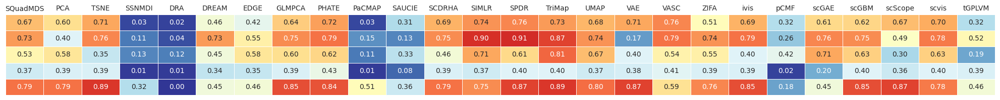

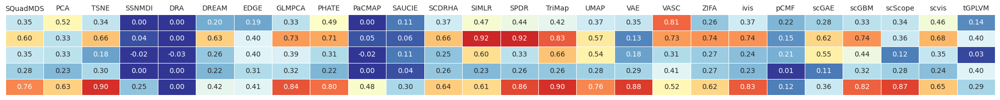

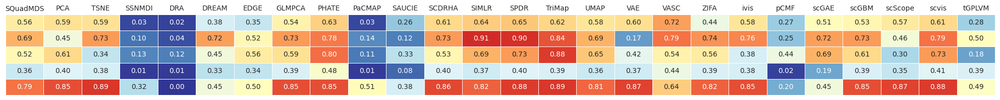

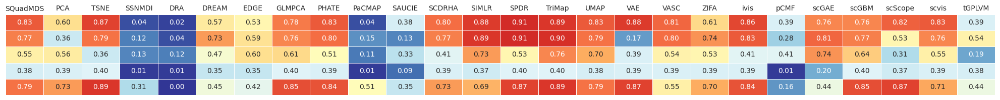

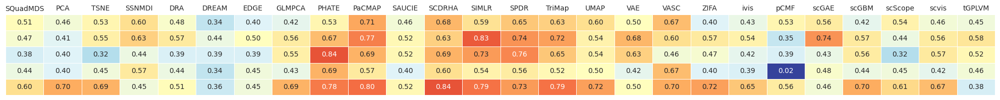

...

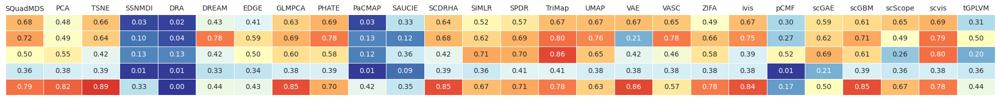

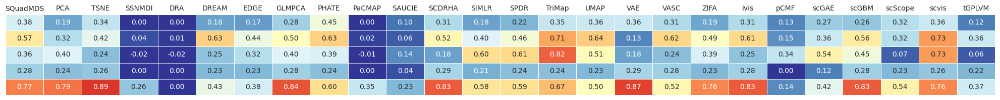

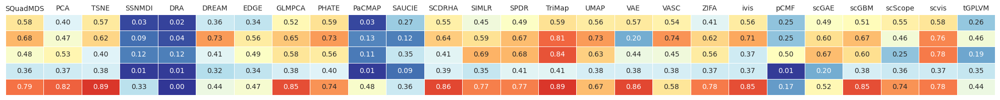

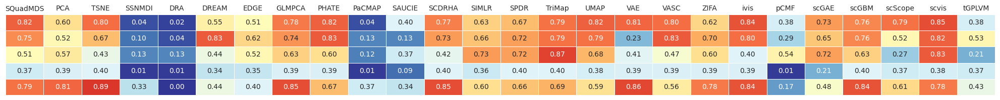

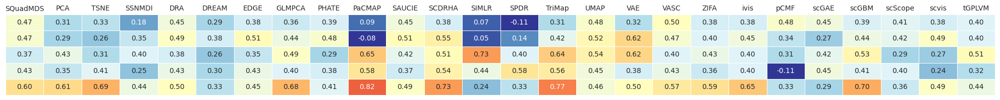

In [10]:
methods = ['kmeans','louvain','spectral']
metrics = ['NMI','ARI','COMP','HOMO','SIL']
for method in methods:
    for metric in metrics:
        '''
        file和df这两处需要修改
        '''
        file1 = f"/home/henu/work/result/cluster/benchmarker/Baron_mouse/indicators/{method}_{metric}.csv"
        file2 = f"/home/henu/work/result/cluster/benchmarker/Darmanis/indicators/{method}_{metric}.csv"
        file3 = f"/home/henu/work/result/cluster/benchmarker/Pancreatic/indicators/{method}_{metric}.csv"
        file4 = f"/home/henu/work/result/cluster/benchmarker/Silver/indicators/{method}_{metric}.csv"
        file5 = f"/home/henu/work/result/cluster/benchmarker/Zhengmix4eq/indicators/{method}_{metric}.csv"

        # 读取文件
        df1 = pd.read_csv(file1)
        df1['Dataset'] = 'Baron_mouse'
        df2 = pd.read_csv(file2)
        df2['Dataset'] = 'Darmanis'
        df3 = pd.read_csv(file3)
        df3['Dataset'] = 'Pancreatic'
        df4 = pd.read_csv(file4)
        df4['Dataset'] = 'Silver'
        df5 = pd.read_csv(file5)
        df5['Dataset'] = 'Zhengmix4eq'


        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df1 = df1[~df1['Method'].isin(excluded_methods)]
        df2 = df2[~df2['Method'].isin(excluded_methods)]
        df3 = df3[~df3['Method'].isin(excluded_methods)]
        df4 = df4[~df4['Method'].isin(excluded_methods)]
        df5 = df5[~df5['Method'].isin(excluded_methods)]

        # 重命名方法名
        df1.loc[df1['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
        df2.loc[df2['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
        df3.loc[df3['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
        df4.loc[df4['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
        df5.loc[df5['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df1,df2,df3,df4,df5])

        # 透视表：行是数据集，列是方法，值是NMI
        heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

        # 将0.00和-0.00替换为0
        heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


        # 重新排序列，将SSNMDI与TSNE换一下位置
        order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
        heatmap_data = heatmap_data[order]

        # 画图
        '''
        按一个数据集高为0.35来调节
        '''
        plt.figure(figsize=(20, 2.1))  # 调节宽和高
        ax = sns.heatmap(
            heatmap_data,
            annot=True,
            fmt=".2f",
            cmap=cmap,
            linewidths=0.5,
            # cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
            cbar=False,
            vmin=0.0,  # 颜色条取值范围
            vmax=1.0
        )

        # 移除x轴和y轴的标签
        ax.set_xlabel('')
        ax.set_ylabel('')
        # 将指标名称移到顶部
        ax.xaxis.set_ticks_position('top')
        ax.xaxis.set_label_position('top')
        # 移除所有刻度线
        ax.tick_params(axis='both', which='both', length=0)

         # 移除左侧数据集名称
        ax.set_yticklabels([])

        # 旋转y轴标签，使其横向显示
        # plt.yticks(rotation=0)  # 0 度旋转，即横向显示

        plt.tight_layout()

        # 保存为矢量图###
        result_path = f'/home/henu/work/result/figures/cluster1/{metric}/{method}'
        if not os.path.exists(result_path):
            os.makedirs(result_path)
        plt.savefig(f'/home/henu/work/result/figures/cluster1/{metric}/{method}/benchmarker.svg')
        plt.savefig(f'/home/henu/work/result/figures/cluster1/{metric}/{method}/benchmarker.pdf')
        # plt.show()

### VASC

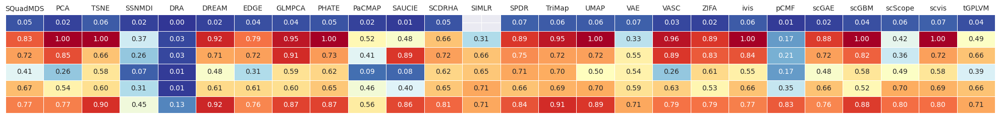

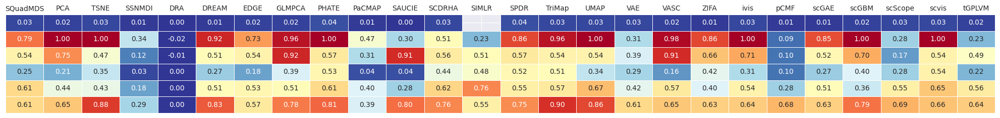

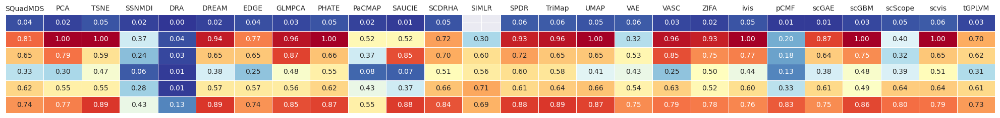

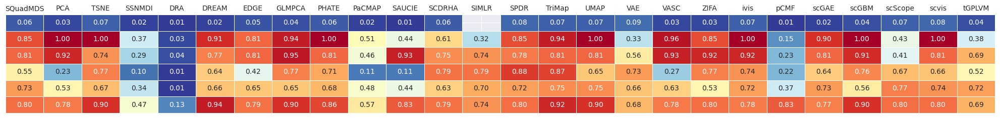

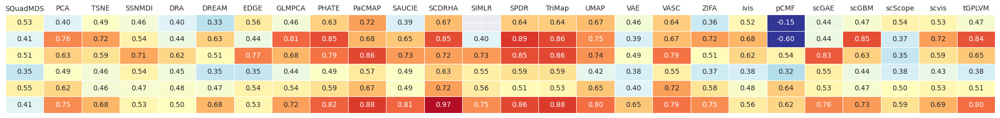

...

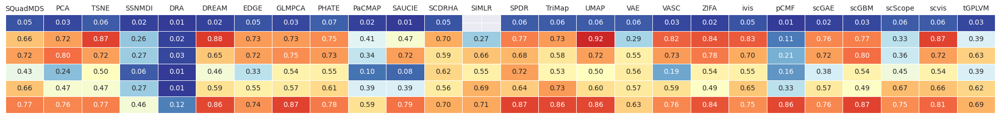

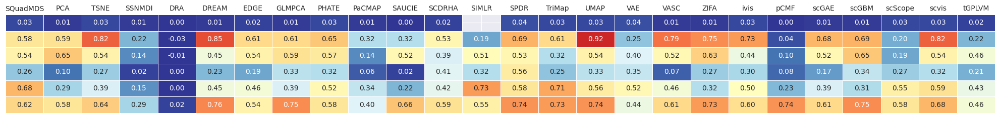

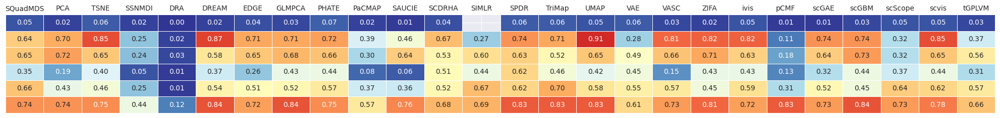

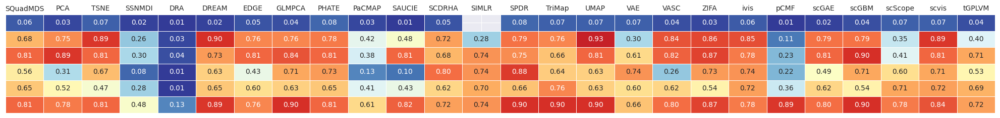

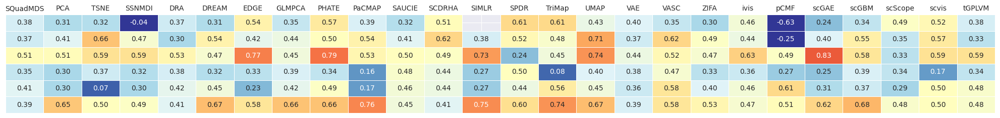

In [11]:
methods = ['kmeans','louvain','spectral']
metrics = ['NMI','ARI','COMP','HOMO','SIL']
for method in methods:
    for metric in metrics:
        '''
        file和df这两处需要修改
        '''
        file1 = f"/home/henu/work/result/cluster/VASC/Baron/indicators/{method}_{metric}.csv"
        file2 = f"/home/henu/work/result/cluster/VASC/Biase/indicators/{method}_{metric}.csv"
        file3 = f"/home/henu/work/result/cluster/VASC/Goolam/indicators/{method}_{metric}.csv"
        file4 = f"/home/henu/work/result/cluster/VASC/Xin/indicators/{method}_{metric}.csv"
        file5 = f"/home/henu/work/result/cluster/VASC/yan/indicators/{method}_{metric}.csv"
        file6 = f"/home/henu/work/result/cluster/VASC/Zeisel/indicators/{method}_{metric}.csv"

        # 读取文件
        df1 = pd.read_csv(file1)
        df1['Dataset'] = 'Baron'
        df2 = pd.read_csv(file2)
        df2['Dataset'] = 'Biase'
        df3 = pd.read_csv(file3)
        df3['Dataset'] = 'Goolam'
        df4 = pd.read_csv(file4)
        df4['Dataset'] = 'Xin'
        df5 = pd.read_csv(file5)
        df5['Dataset'] = 'yan'
        df6 = pd.read_csv(file6)
        df6['Dataset'] = 'Zeisel'


        # 排除特定的行
        excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
        df1 = df1[~df1['Method'].isin(excluded_methods)]
        df2 = df2[~df2['Method'].isin(excluded_methods)]
        df3 = df3[~df3['Method'].isin(excluded_methods)]
        df4 = df4[~df4['Method'].isin(excluded_methods)]
        df5 = df5[~df5['Method'].isin(excluded_methods)]
        df6 = df6[~df6['Method'].isin(excluded_methods)]

        # 重命名方法名
        df1.loc[df1['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
        df2.loc[df2['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
        df3.loc[df3['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
        df4.loc[df4['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
        df5.loc[df5['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'
        df6.loc[df6['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

        # 拼接
        df_all = pd.concat([df1,df2,df3,df4,df5,df6])
        # print(df_all)

        # 透视表：行是数据集，列是方法，值是NMI
        heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

        # 将0.00和-0.00替换为0
        heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


        # 重新排序列，将SSNMDI与TSNE换一下位置
        order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
        heatmap_data = heatmap_data[order]

        # 画图
        '''
        按一个数据集高为0.35来调节
        '''
        plt.figure(figsize=(20, 2.45))  # 调节宽和高
        ax = sns.heatmap(
            heatmap_data,
            annot=True,
            fmt=".2f",
            cmap=cmap,
            linewidths=0.5,
            # cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
            cbar=False,
            vmin=0.0,  # 颜色条取值范围
            vmax=1.0
        )

        # 移除x轴和y轴的标签
        ax.set_xlabel('')
        ax.set_ylabel('')
        # 将指标名称移到顶部
        ax.xaxis.set_ticks_position('top')
        ax.xaxis.set_label_position('top')
        # 移除所有刻度线
        ax.tick_params(axis='both', which='both', length=0)

         # 移除左侧数据集名称
        ax.set_yticklabels([])

        # 旋转y轴标签，使其横向显示
        # plt.yticks(rotation=0)  # 0 度旋转，即横向显示

        plt.tight_layout()

        # 保存为矢量图###
        result_path = f'/home/henu/work/result/figures/cluster1/{metric}/{method}'
        if not os.path.exists(result_path):
            os.makedirs(result_path)
        plt.savefig(f'/home/henu/work/result/figures/cluster1/{metric}/{method}/VASC.svg')
        plt.savefig(f'/home/henu/work/result/figures/cluster1/{metric}/{method}/VASC.pdf')
        # plt.show()

### TI

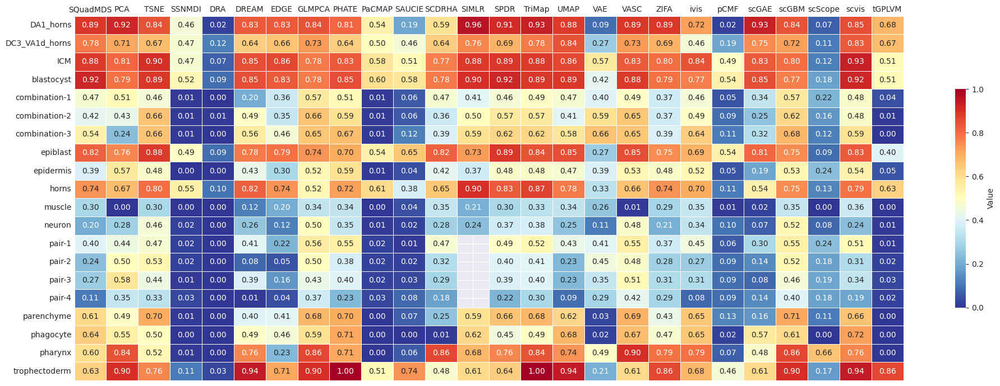

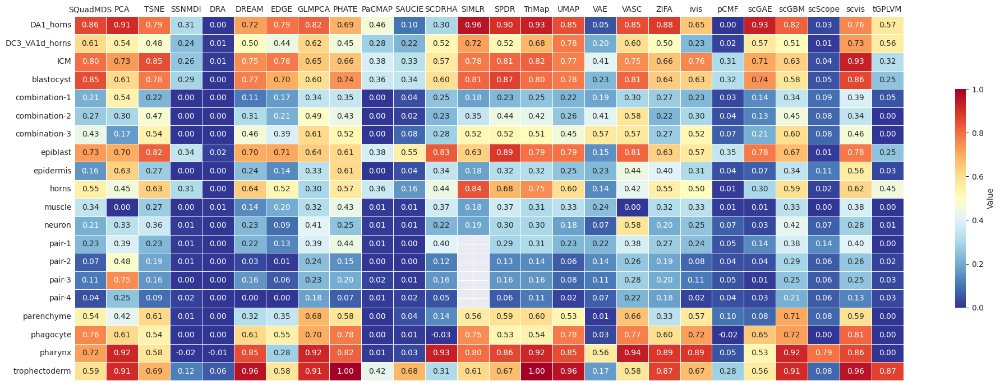

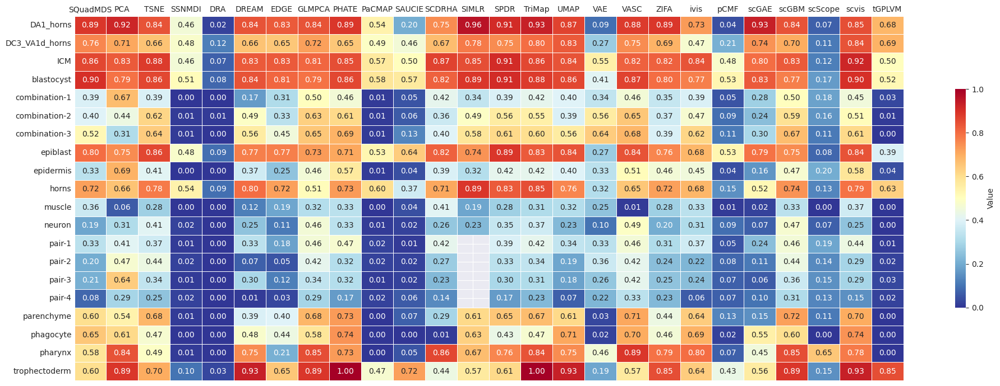

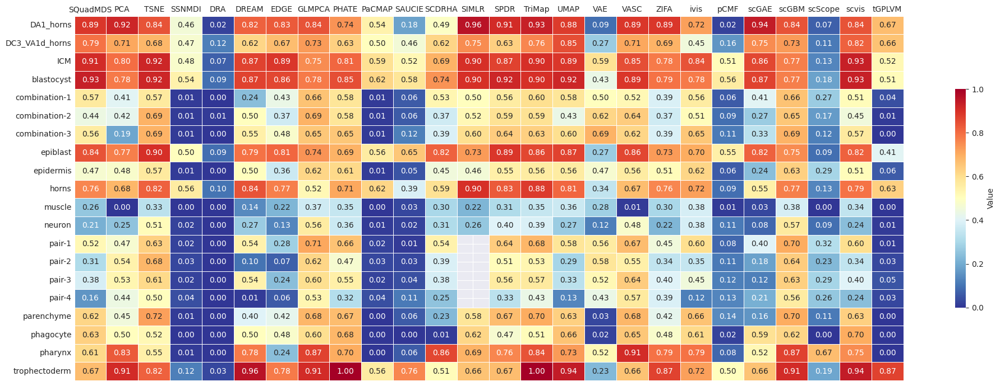

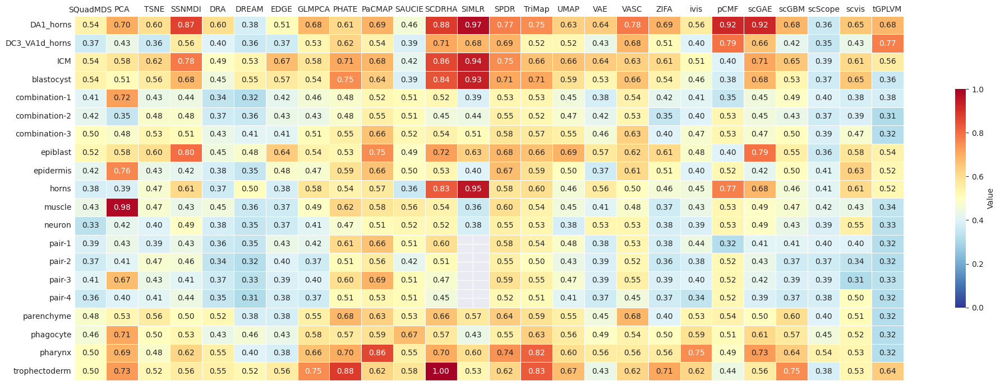

...

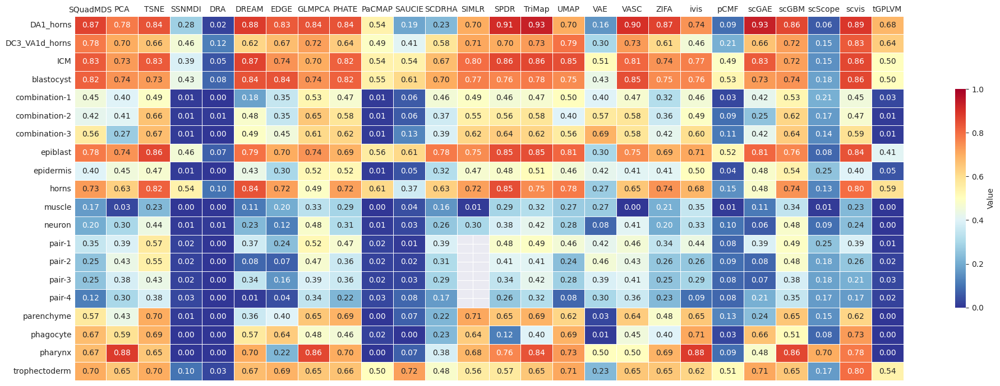

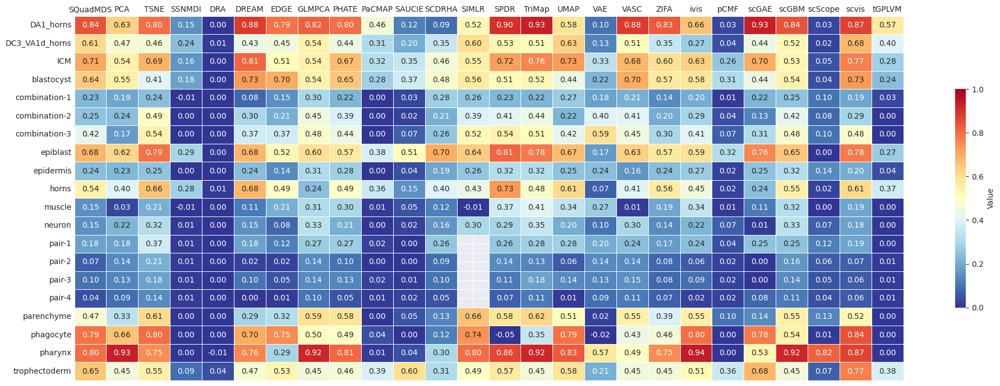

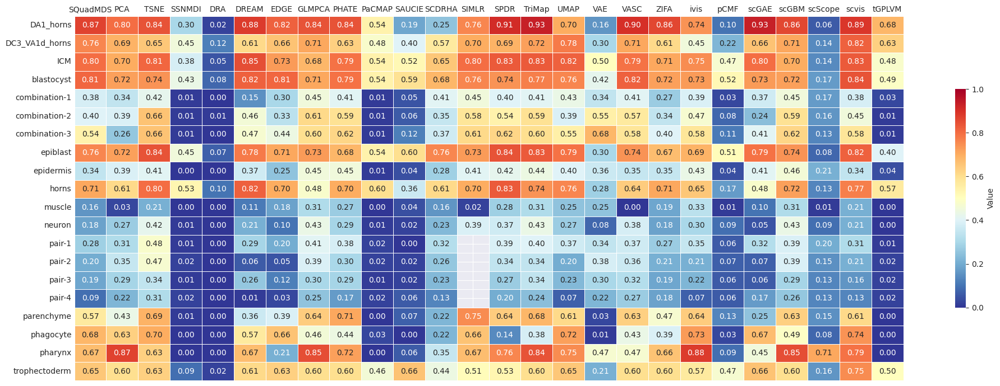

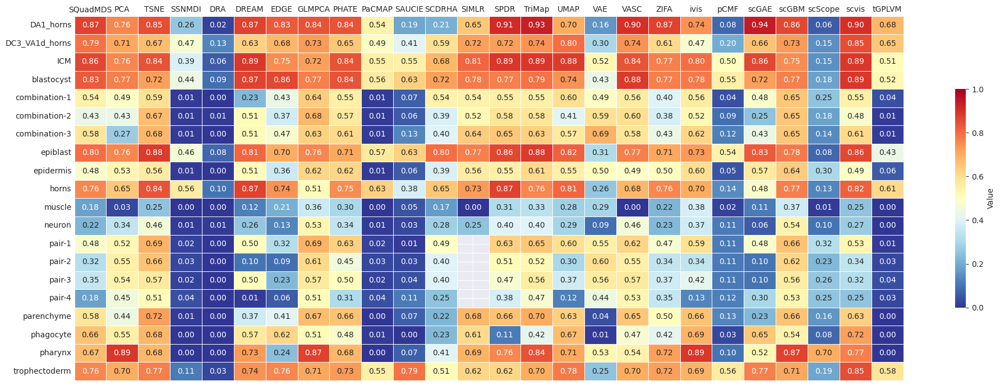

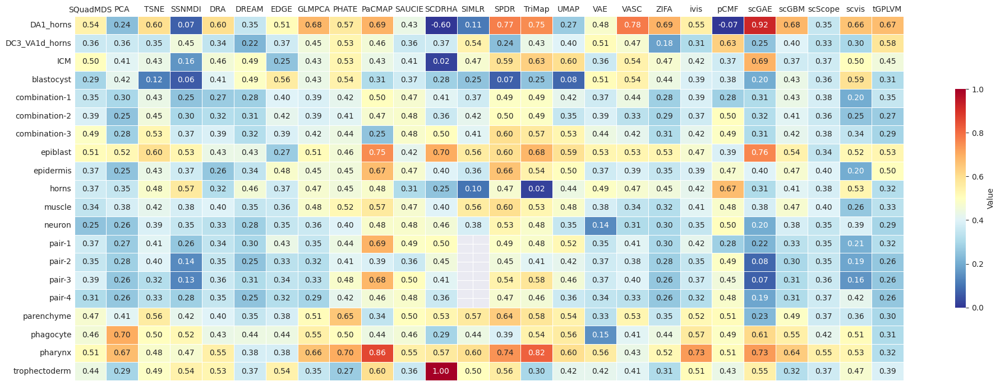

In [37]:
methods = ['kmeans','louvain','spectral']
metrics = ['NMI','ARI','COMP','HOMO','SIL']
for method in methods:
    for metric in metrics:
        datasets = ['DA1_horns','DC3_VA1d_horns','horns','blastocyst','epiblast','ICM','trophectoderm','combination-1','combination-2','combination-3','epidermis','muscle','neuron','pair-1','pair-2','pair-3','pair-4','parenchyme','phagocyte','pharynx']
        df_all = pd.DataFrame()

        for dataset in datasets:
            file = f"/home/henu/work/result/cluster/TI/{dataset}/indicators/{method}_{metric}.csv"
            df = pd.read_csv(file)
            df['Dataset'] = dataset

            # 排除特定的行
            excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
            df = df[~df['Method'].isin(excluded_methods)]

            # 重命名方法名
            df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

            # 拼接
            df_all = pd.concat([df_all, df])

        # print(df_all)
        # 透视表：行是数据集，列是方法，值是NMI
        heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

        # 将0.00和-0.00替换为0
        heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


        # 重新排序列，将SSNMDI与TSNE换一下位置
        order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
        heatmap_data = heatmap_data[order]

        # 画图
        '''
        按一个数据集高为0.35来调节
        '''
        plt.figure(figsize=(20, 7))  # 调节宽和高
        ax = sns.heatmap(
            heatmap_data,
            annot=True,
            fmt=".2f",
            cmap=cmap,
            linewidths=0.5,
            cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
            vmin=0.0,  # 颜色条取值范围
            vmax=1.0
        )

        # 移除x轴和y轴的标签
        ax.set_xlabel('')
        ax.set_ylabel('')
        # 将指标名称移到顶部
        ax.xaxis.set_ticks_position('top')
        ax.xaxis.set_label_position('top')
        # 移除所有刻度线
        ax.tick_params(axis='both', which='both', length=0)

        # 旋转y轴标签，使其横向显示
        plt.yticks(rotation=0)  # 0 度旋转，即横向显示

        plt.tight_layout()

        # 保存为矢量图###
        result_path = f'/home/henu/work/result/figures/cluster/{metric}/{method}'
        if not os.path.exists(result_path):
            os.makedirs(result_path)
        plt.savefig(f'/home/henu/work/result/figures/cluster/{metric}/{method}/TI.svg')
        plt.savefig(f'/home/henu/work/result/figures/cluster/{metric}/{method}/TI.pdf')
        # plt.show()


### simulate

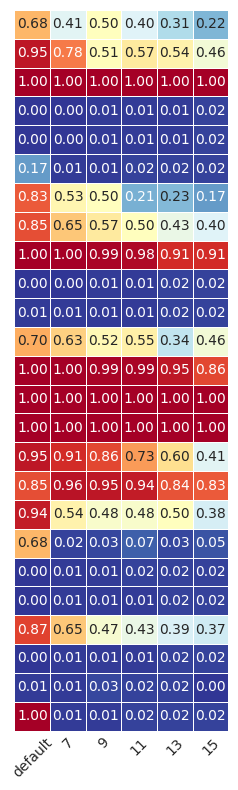

In [26]:
methods = ['kmeans']
metrics = ['NMI']
for method in methods:
    for metric in metrics:
        datasets = ['default','celltype_7','celltype_9', 'celltype_11', 'celltype_13', 'celltype_15']
        df_all = pd.DataFrame()

        for dataset in datasets:
            file = f"/home/henu/work/result/cluster/simulate/{dataset}/indicators/{method}_{metric}.csv"
            df = pd.read_csv(file)
            df['Dataset'] = dataset

            # 排除特定的行
            excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
            df = df[~df['Method'].isin(excluded_methods)]

            # 重命名方法名
            df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

            # 拼接
            df_all = pd.concat([df_all, df])

        # print(df_all)
        # 透视表：行是数据集，列是方法，值是NMI
        heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

        # 将0.00和-0.00替换为0
        heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


        # 重新排序列，将SSNMDI与TSNE换一下位置
        order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
        heatmap_data = heatmap_data[order]
        heatmap_data = heatmap_data.loc[['default','celltype_7','celltype_9', 'celltype_11', 'celltype_13', 'celltype_15']]
        heatmap_data = heatmap_data.T
        heatmap_data.columns = ['default','7','9','11','13','15']

        # 画图
        '''
        按一个数据集高为0.35来调节
        (20,7)
        '''
        plt.figure(figsize=(2.5, 8))  # 调节宽和高
        ax = sns.heatmap(
            heatmap_data,
            annot=True,
            fmt=".2f",
            cmap=cmap,
            linewidths=0.5,
            # cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
            cbar=False,
            vmin=0.0,  # 颜色条取值范围
            vmax=1.0
        )

        # 移除x轴和y轴的标签
        ax.set_xlabel('')
        ax.set_ylabel('')
        # 将指标名称移到顶部
        ax.xaxis.set_ticks_position('top')
        ax.xaxis.set_label_position('top')
        # 移除所有刻度线
        ax.tick_params(axis='both', which='both', length=0)
        # 列标签放在图底部
        ax.xaxis.tick_bottom()

        # 移除左侧数据集名称
        ax.set_yticklabels([])

        # 旋转y轴标签，使其横向显示
        # plt.yticks(rotation=0)  # 0 度旋转，即横向显示
        plt.xticks(rotation=45)

        plt.tight_layout()

        plt.savefig(f'/home/henu/work/analysis/cell.svg')
        plt.show()

        # plt.savefig(f'/home/henu/work/analysis/test_figures/out.svg')

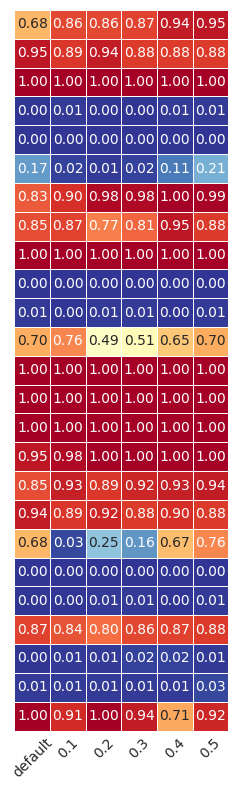

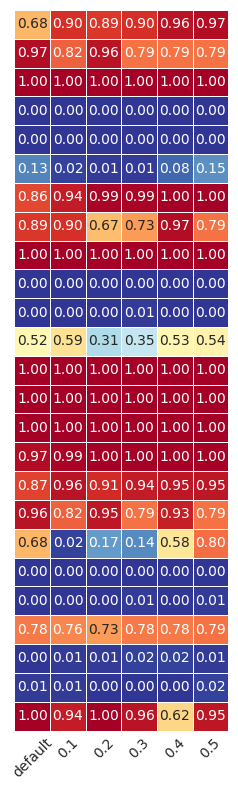

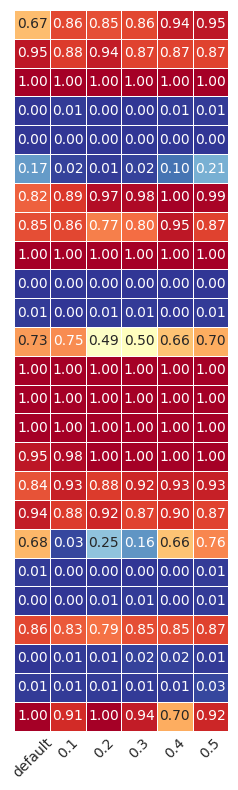

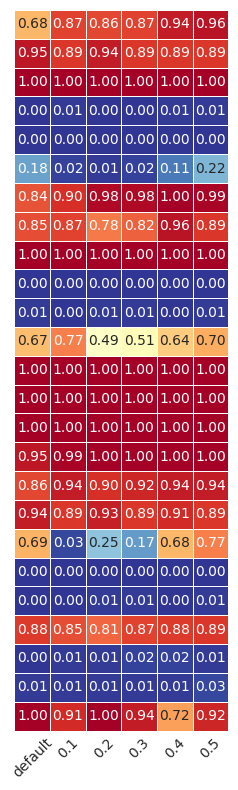

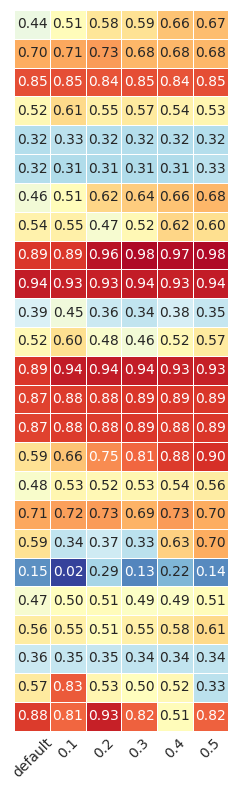

...

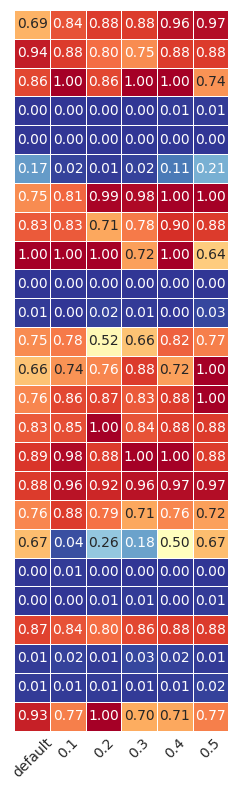

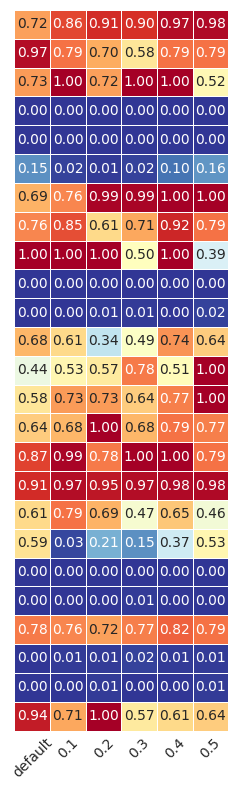

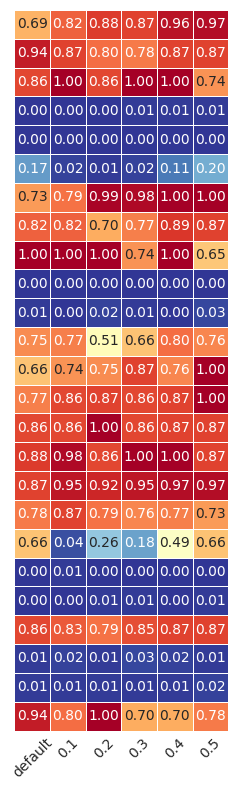

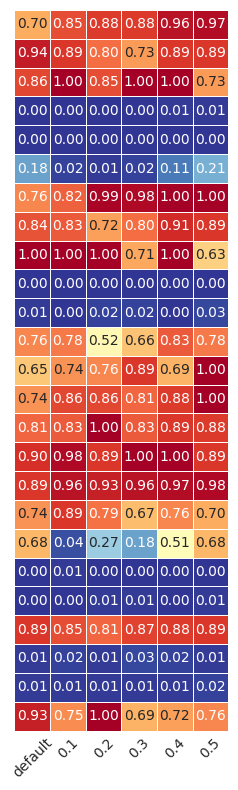

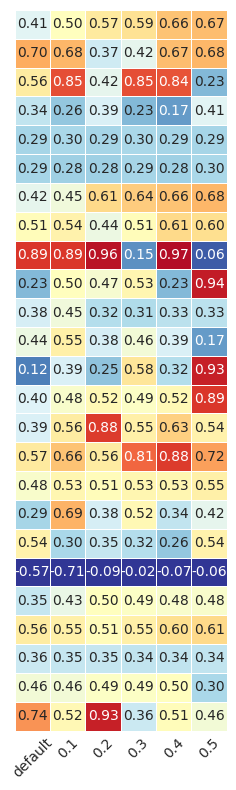

In [34]:
methods = ['kmeans','louvain','spectral']
metrics = ['NMI','ARI','COMP','HOMO','SIL']
for method in methods:
    for metric in metrics:
        datasets = ['default','out_0.1','out_0.2', 'out_0.3', 'out_0.4', 'out_0.5']
        df_all = pd.DataFrame()

        for dataset in datasets:
            file = f"/home/henu/work/result/cluster/simulate/{dataset}/indicators/{method}_{metric}.csv"
            df = pd.read_csv(file)
            df['Dataset'] = dataset

            # 排除特定的行
            excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
            df = df[~df['Method'].isin(excluded_methods)]

            # 重命名方法名
            df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

            # 拼接
            df_all = pd.concat([df_all, df])

        # print(df_all)
        # 透视表：行是数据集，列是方法，值是NMI
        heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

        # 将0.00和-0.00替换为0
        heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


        # 重新排序列，将SSNMDI与TSNE换一下位置
        order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
        heatmap_data = heatmap_data[order]
        heatmap_data = heatmap_data.loc[['default','out_0.1','out_0.2', 'out_0.3', 'out_0.4', 'out_0.5']]
        heatmap_data = heatmap_data.T
        heatmap_data.columns = ['default','0.1','0.2','0.3','0.4','0.5']

        # 画图
        '''
        按一个数据集高为0.35来调节
        (6,8)
        '''
        plt.figure(figsize=(2.5, 8))  # 调节宽和高
        ax = sns.heatmap(
            heatmap_data,
            annot=True,
            fmt=".2f",
            cmap=cmap,
            linewidths=0.5,
            # cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
            cbar=False,
            vmin=0.0,  # 颜色条取值范围
            vmax=1.0
        )

        # 移除x轴和y轴的标签
        ax.set_xlabel('')
        ax.set_ylabel('')
        # 将指标名称移到顶部
        ax.xaxis.set_ticks_position('top')
        ax.xaxis.set_label_position('top')
        # 移除所有刻度线
        ax.tick_params(axis='both', which='both', length=0)
        # 列标签放在图底部
        ax.xaxis.tick_bottom()

        # 移除左侧数据集名称
        ax.set_yticklabels([])

        # 旋转y轴标签，使其横向显示
        # plt.yticks(rotation=0)  # 0 度旋转，即横向显示
        plt.xticks(rotation=45)

        plt.tight_layout()

        # 保存为矢量图###
        result_path = f'/home/henu/work/result/figures/cluster1/{metric}/{method}'
        if not os.path.exists(result_path):
            os.makedirs(result_path)
        plt.savefig(f'/home/henu/work/result/figures/cluster1/{metric}/{method}/out.svg')
        plt.savefig(f'/home/henu/work/result/figures/cluster1/{metric}/{method}/out.pdf')
        plt.show()

        # plt.savefig(f'/home/henu/work/analysis/test_figures/out.svg')

### 整合(VASC、SIMLR、benchmarker、DRA)

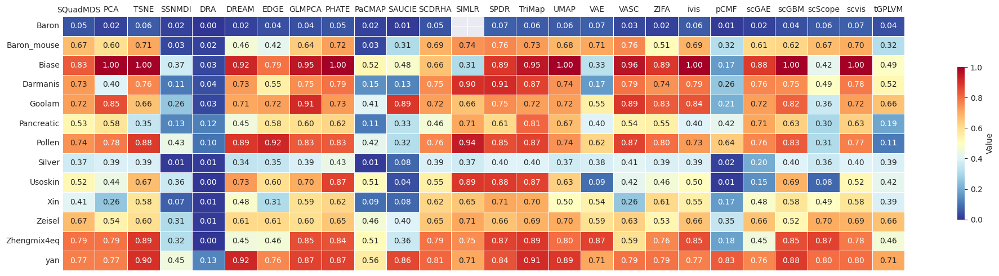

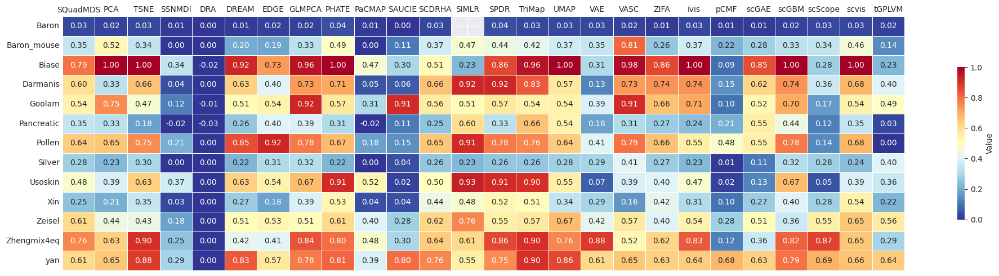

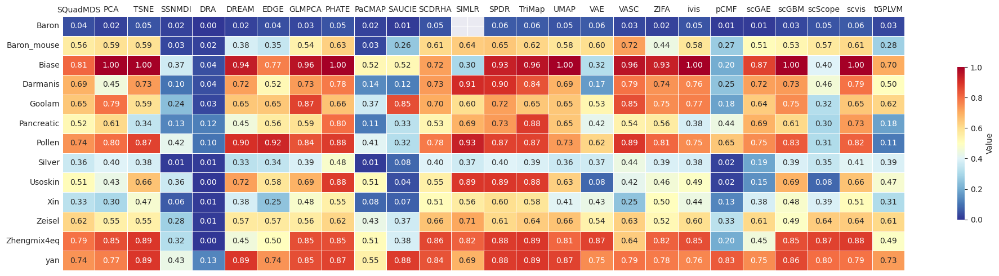

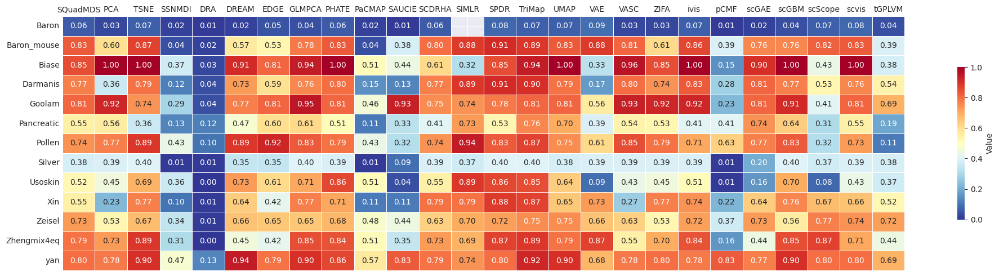

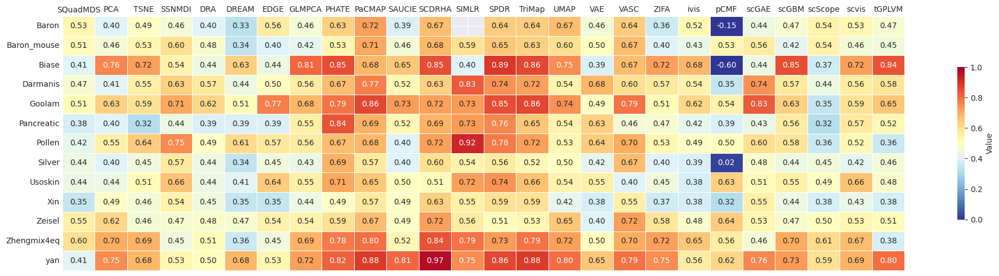

...

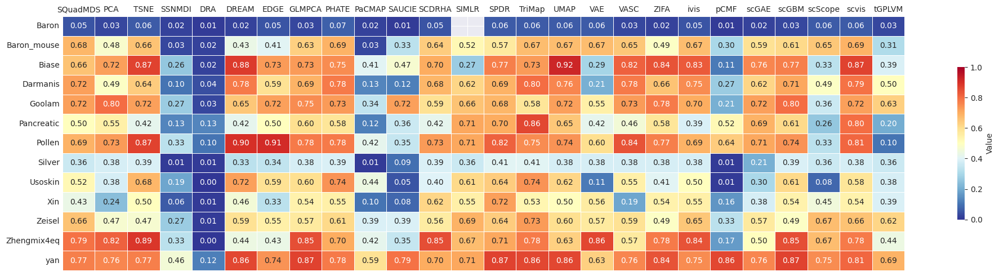

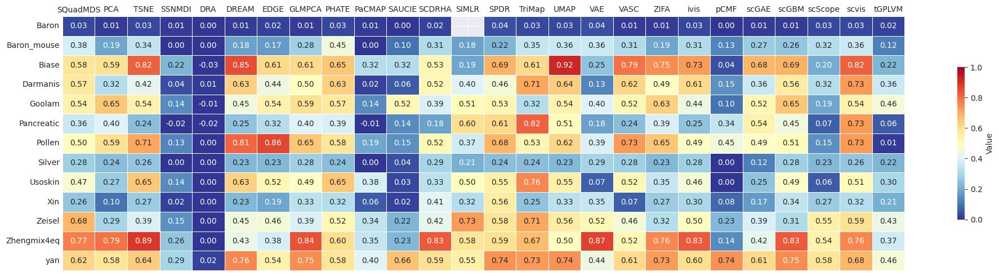

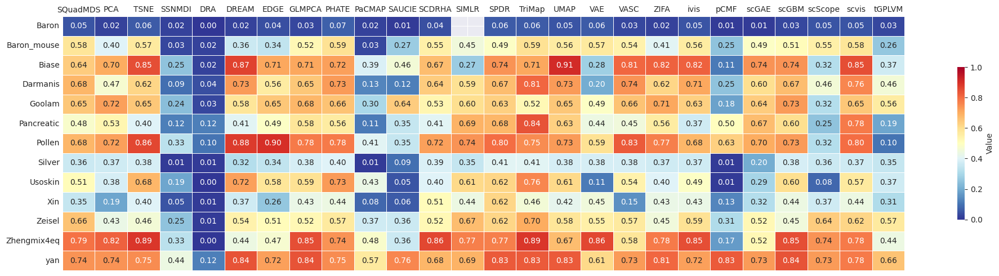

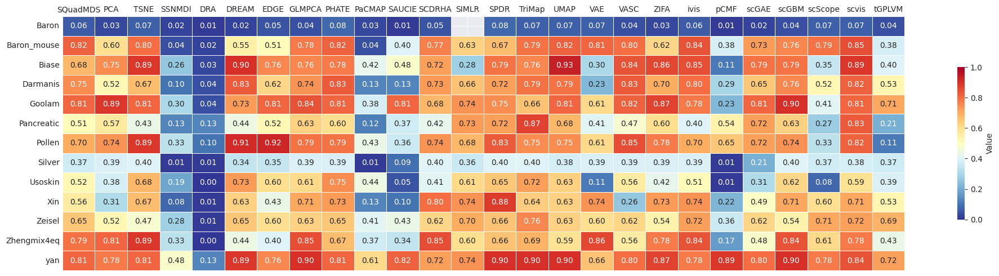

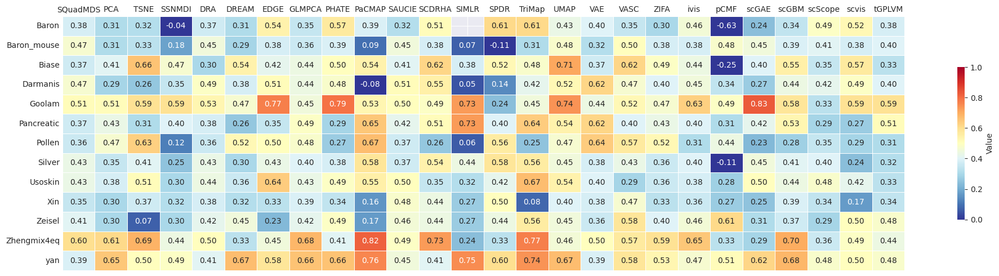

In [40]:
methods = ['kmeans','louvain','spectral']
metrics = ['NMI','ARI','COMP','HOMO','SIL']
for method in methods:
    for metric in metrics:
        '''
        目前DRA指标还没有跑出来，暂不整合
        '''
        df_all = pd.DataFrame()
        fragments = ['VASC','SIMLR','benchmarker']
        for fragment in fragments:
            if fragment == 'VASC':
                datasets = ['Baron','Biase','Goolam','Xin','yan','Zeisel']
            elif fragment == 'SIMLR':
                datasets = ['Pollen','Usoskin']
            elif fragment == 'benchmarker':
                datasets = ['Baron_mouse','Darmanis','Pancreatic','Silver','Zhengmix4eq']
            else:
                datasets = []

            for dataset in datasets:
                file = f"/home/henu/work/result/cluster/{fragment}/{dataset}/indicators/{method}_{metric}.csv"
                df = pd.read_csv(file)
                df['Dataset'] = dataset

                # 排除特定的行
                excluded_methods = ['SQuaD_MDS', 'ParametricUMAP200', 'ParametricUMAP50']
                df = df[~df['Method'].isin(excluded_methods)]

                # 重命名方法名
                df.loc[df['Method'] == 'SQuaD_MDS_hybrid', 'Method'] = 'SQuadMDS'

                # 拼接
                df_all = pd.concat([df_all, df])

        # print(df_all)
        # 透视表：行是数据集，列是方法，值是NMI
        heatmap_data = df_all.pivot(index='Dataset', columns='Method', values=metric)

        # 将0.00和-0.00替换为0
        heatmap_data = heatmap_data.apply(lambda x: x.map(lambda y: 0 if y == 0.00 or y == -0.00 else y))


        # 重新排序列，将SSNMDI与TSNE换一下位置
        order = ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI'] + [col for col in heatmap_data.columns if col not in ['SQuadMDS', 'PCA', 'TSNE', 'SSNMDI']]
        heatmap_data = heatmap_data[order]

        # 画图
        '''
        按一个数据集高为0.35来调节
        '''
        plt.figure(figsize=(20, 5))  # 调节宽和高
        ax = sns.heatmap(
            heatmap_data,
            annot=True,
            fmt=".2f",
            cmap=cmap,
            linewidths=0.5,
            cbar_kws={'label': 'Value', 'shrink': 0.6, 'extend': 'neither'},  # 颜色条lable和长度
            vmin=0.0,  # 颜色条取值范围
            vmax=1.0
        )

        # 移除x轴和y轴的标签
        ax.set_xlabel('')
        ax.set_ylabel('')
        # 将指标名称移到顶部
        ax.xaxis.set_ticks_position('top')
        ax.xaxis.set_label_position('top')
        # 移除所有刻度线
        ax.tick_params(axis='both', which='both', length=0)

        # 旋转y轴标签，使其横向显示
        plt.yticks(rotation=0)  # 0 度旋转，即横向显示

        plt.tight_layout()

        # 保存为矢量图###
        result_path = f'/home/henu/work/result/figures/cluster/{metric}/{method}'
        if not os.path.exists(result_path):
            os.makedirs(result_path)
        plt.savefig(f'/home/henu/work/result/figures/cluster/{metric}/{method}/other.svg')
        plt.savefig(f'/home/henu/work/result/figures/cluster/{metric}/{method}/other.pdf')
        # plt.show()
